In [156]:
import numpy as np
from  matplotlib import pyplot as plt
from skimage.transform import resize
import tensorflow as tf
import PIL
import tensorflow.keras.applications.vgg19 as vgg19_model
from tensorflow.keras import Model

# Get Images

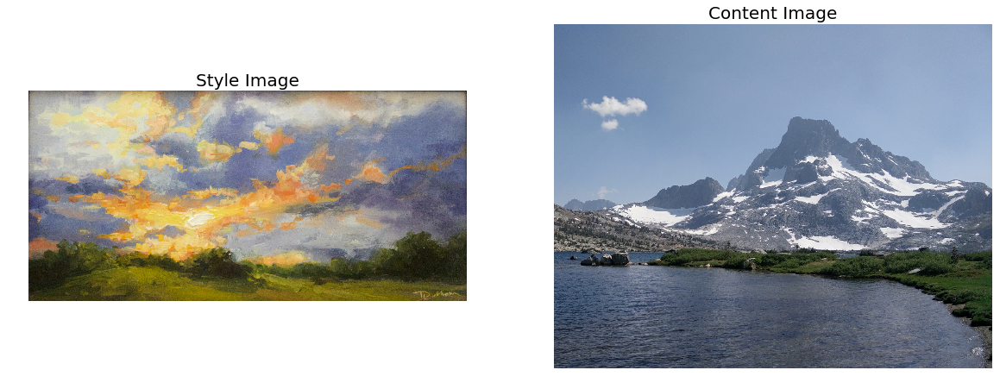

In [161]:
style = '/Users/chinmay/Desktop/175/oil image.jpg'
content = '/Users/chinmay/Desktop/175/landscape.jpg'


style_image = load_img(style)
content_image = load_img(content)

#show results
f, ax = plt.subplots(1,2,figsize=(20,20))
ax[0].imshow(style_image[0])
ax[0].set_title("Style Image", size = 20)
ax[1].imshow(content_image[0])
ax[1].set_title("Content Image", size = 20)
[ax.axis("off") for ax in f.axes] #Turn axis off
plt.show()

#style_image = resize(style_image, content_image.shape) #make style same size as content

In [15]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

In [16]:
def load_image(image_path):
    max_dim = 512
    
    image = plt.imread(image_path)
    image = tf.image.convert_image_dtype(image, tf.float32)
    
    shape = tf.shape(image)[:-1].numpy()

    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    image = tf.image.resize(image, new_shape)
    image = image[tf.newaxis, :]
    return image

# VGG and Some Helper Functions

In [67]:

'''Return a tf.model which can be called to get all intermediate layers from given list of layer names'''

def vgg_layers(total_layers):
    vgg = tf.keras.applications.VGG19(pooling = 'avg',include_top=False, weights='imagenet') #Create VGG Object
    vgg.trainable = False
    layers_list = [vgg.get_layer(name).output for name in total_layers] #Get all layers of given layer names
    feat_extraction_model = tf.keras.Model([vgg.input], outputs = layers_list)  #Create Object given input layers

    return feat_extraction_model


In [163]:
content_layers_names = ['block5_conv4']
style_layers_names =  ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']

#Vgg model obj has avg pooling, preset imagenet as training data, and doesn't require top layers.
vgg = vgg19_model.VGG19(pooling = 'avg', weights='imagenet',include_top=False)

content_layers_model = vgg_layers(content_layers_names) #content layers obj
style_layers_model = vgg_layers(style_layers_names) #style layers obj

target_style_layers = [calc_gram_matrix(layer) for layer in style_layers_model(style_image)]
target_content_layers = content_layers_model(content_image)


## Loss Functions

In [164]:
'''given 'current' and 'target' layers, calculate total loss using MSE'''

def calc_loss(layers, outputs):
    total_loss = [] #total loss array is 1xn matrix, where n=number of content layers
    
    for layer in range(len(layers)):
        layer_loss = ((outputs[layer] - layers[layer])**2)
        total_loss.append(layer_loss)
    return total_loss

In [165]:
'''Required for calculating style loss'''

def calc_gram_matrix(layer):
    
    
    result = tf.linalg.einsum('bijc,bijd->bcd', layer, layer)
    input_shape = tf.shape(layer) #get various features
    h_and_w = input_shape[1] * input_shape[2]
     
    num_locations = tf.cast(h_and_w, tf.float32)
    return result/(num_locations)

    """

    input_shape = tf.shape(layer) #get various features
    num_channels = input_shape[-1]
    h_and_w = input_shape[1] * input_shape[2]
    
    new_tensor = tf.reshape(layer, (num_channels, h_and_w)) #reshape to (channels, h*w)
    
    result = tf.matmul(new_tensor, new_tensor, transpose_b=True)  #(num_c, h*w) * (h*w, (num_c, h*w) = (num_c) * (num_c)
    
    tensor_h_w = tf.cast(h_and_w, tf.float32)
    gram_matrix = gram_matrix / tensor_h_w
    
    gram_matrix = tf.expand_dims(gram_matrix, axis=0) #(1, num_c, num_c)
    
    return (gram_matrix)
    """

In [176]:
'''Function for creating layers'''

def create_layers(image):
    image = image*255
    #processed = vgg19_model.preprocess_input(image)
                   
    style_layers = style_layers_model(image)
    style_outputs = [calc_gram_matrix(layer)for layer in style_layers]
    
    content_outputs = content_layers_model(image)

    return [style_outputs,content_outputs]

# Gradient Descent and Optimization

In [177]:
#Tensor to image
def convert_to_image(tensor, title):    
    tensor = tensor * 225   
    t = tensor[0].numpy()
    final = t.astype(np.uint8)
    
    f, ax = plt.subplots(1,1,figsize=(12, 12))
    ax.imshow(final[0])
    ax.set_title(title, size = 15)
    [ax.axis("off") for ax in f.axes] #Turn axis off
    plt.imshow(final)
    plt.show()

In [168]:
'''Compute weighted loss function for both style and content'''

#1. How does changing alpha/beta affect image quality?
alpha = 1e-2
beta = 1e4
total_variation_weight=30

def style_content_loss(outputs):
    style_outputs = outputs[0]   #current style
    content_outputs = outputs[1] #current content
    
    style_loss = tf.add_n([tf.reduce_mean(((style_outputs[layer] - target_style_layers[layer])**2))
                           for layer in range(len(style_outputs))]) 
                           
    content_loss = tf.add_n([tf.reduce_mean(((content_outputs[layer] - target_content_layers[layer])**2))
                             for layer in range(len(content_outputs))])

    style_loss *= (alpha / len(style_outputs)) #normalize
    content_loss *= (beta / len(content_outputs)) #normalize

    loss = style_loss + content_loss
    return loss


In [173]:
#2. how does adam optimizer compare with LBFGS?

opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)  
output_image = tf.Variable(content_image) #change to variable obj to pass into gradient


In [184]:
'''Stochastic gradient descent to minimize image loss '''

@tf.function()
def gradient(image):
    
    tf.compat.v1.enable_eager_execution()

    with tf.GradientTape() as tape: 

        tape.watch(image) #output_image is variable we are differentiating on
        
        target_style_layers = [calc_gram_matrix(layer) for layer in style_layers_model(style_image)]
        target_content_layers = content_layers_model(content_image)
        
        outputs = create_layers(image)
        loss = style_content_loss(outputs) #our loss function
        loss += total_variation_weight*tf.image.total_variation(image)
        
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))


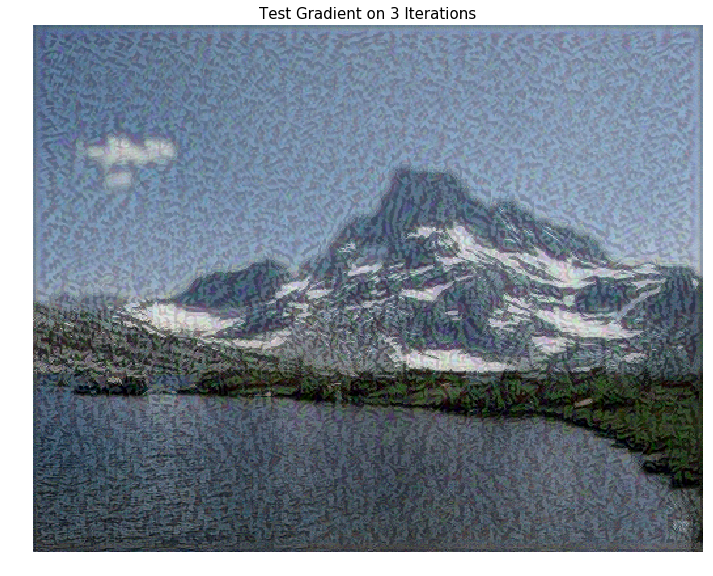

In [182]:
for i in range(3):
    gradient(output_image)
convert_to_image(output_image, "Test Gradient on 3 Iterations")

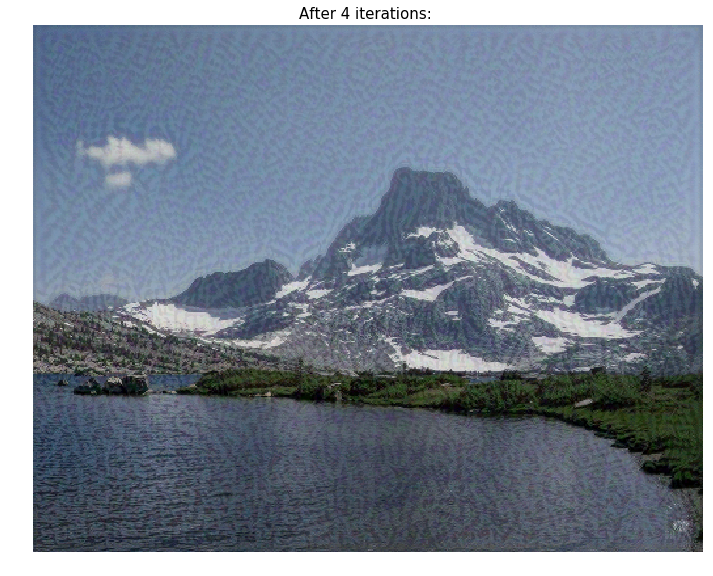

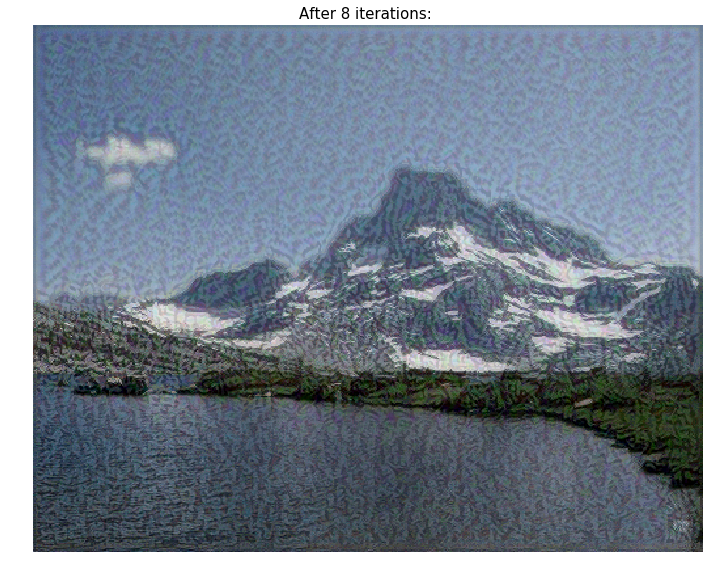

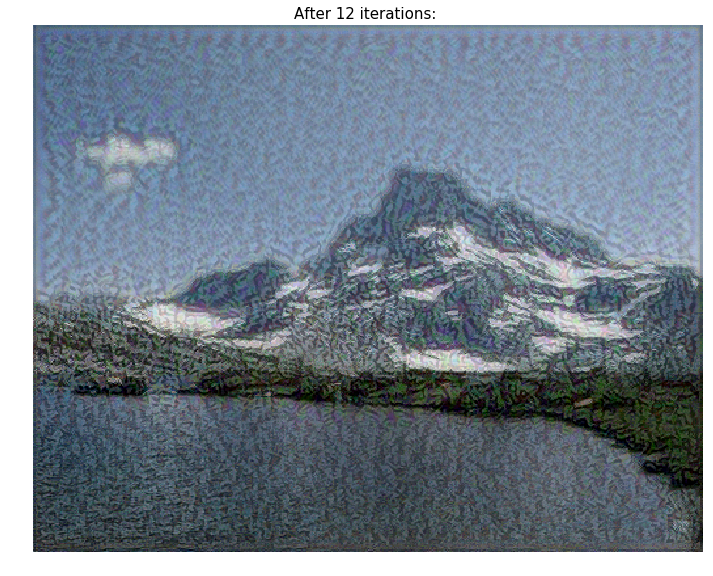

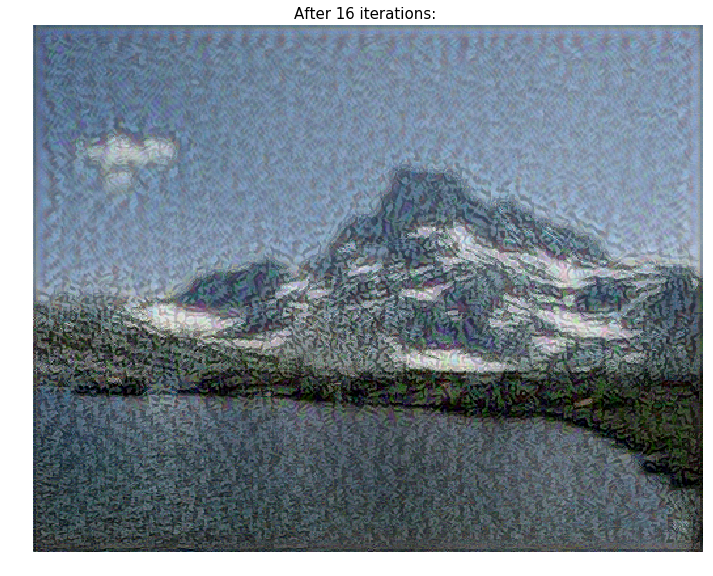

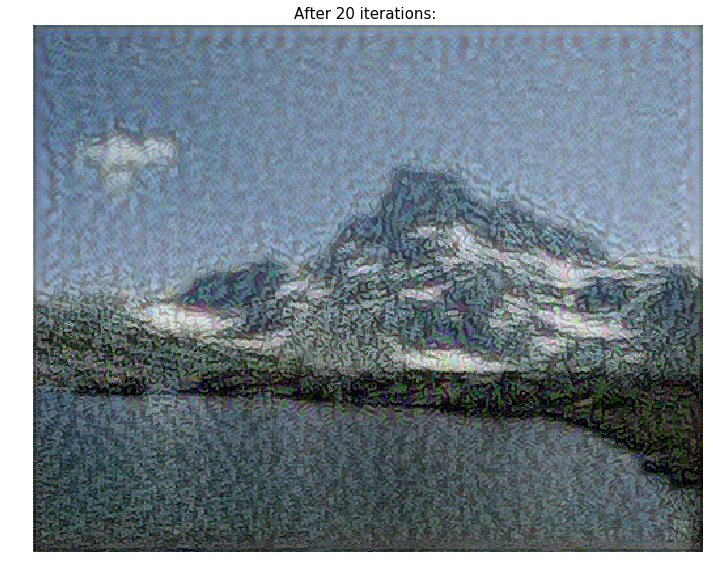

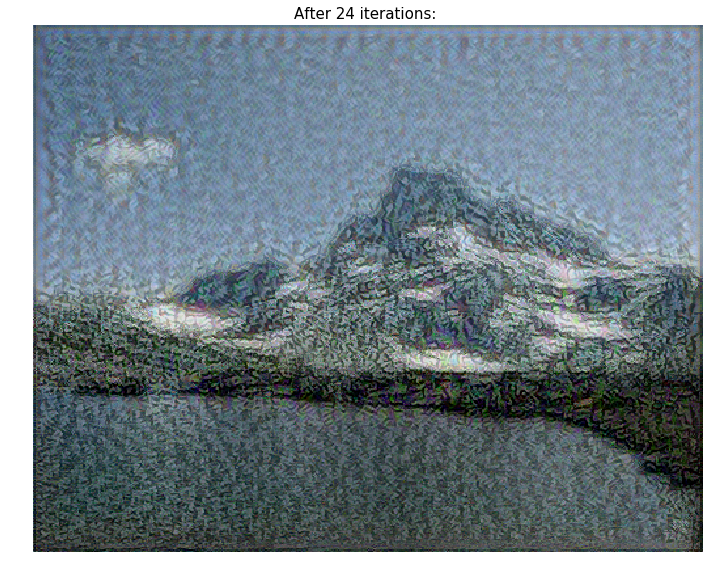

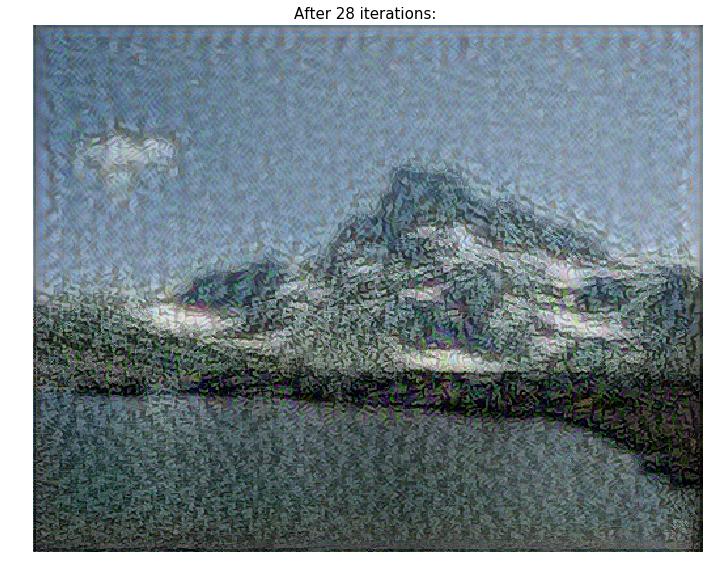

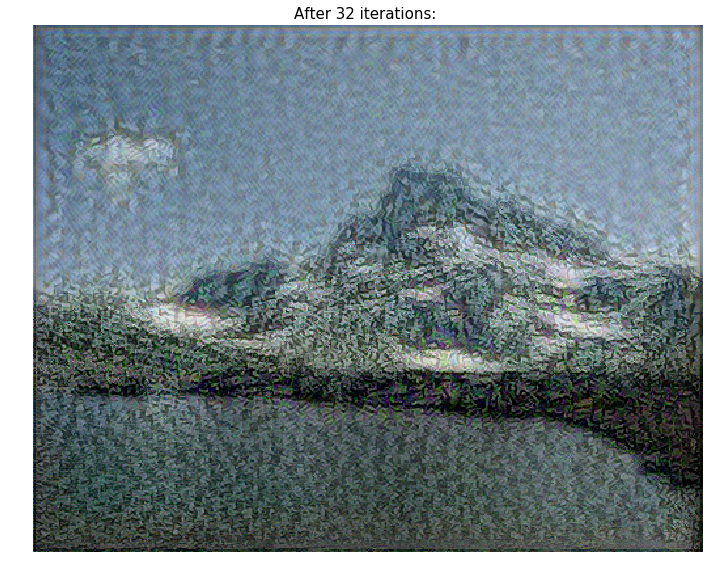

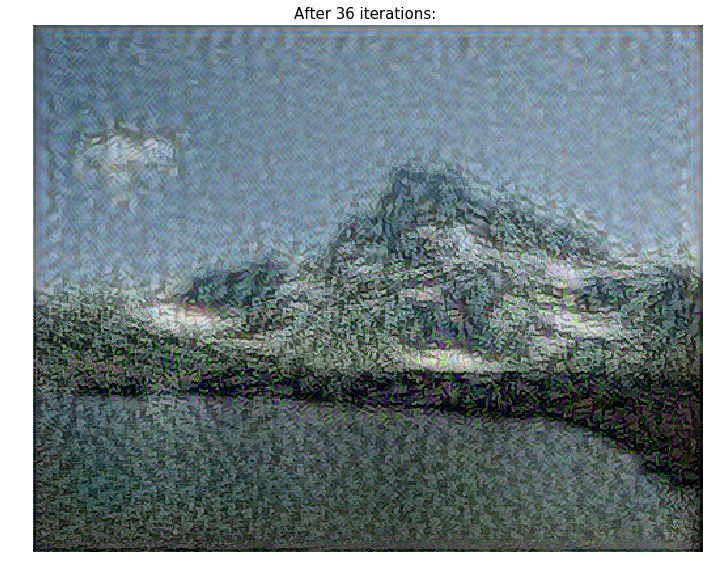

In [ ]:
#with their gram calc
image = tf.Variable(content_image) #change to variable obj to pass into gradient

epochs = 10 #10 batches
steps = 4

curr_step = 0
for i in range(epochs):
    for j in range(steps):
        curr_step += 1
        gradient(image)
        title = "After " + str(curr_step) + " iterations: "
    convert_to_image(image, title)
print("Done")


# Epoch Testing

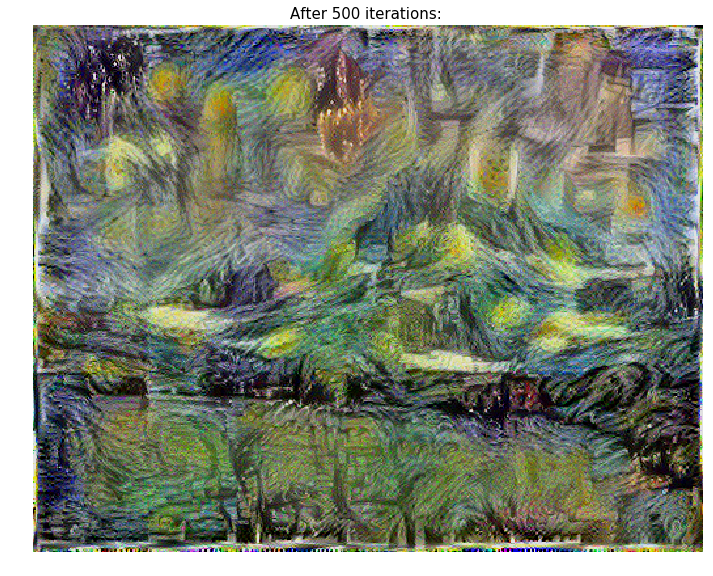

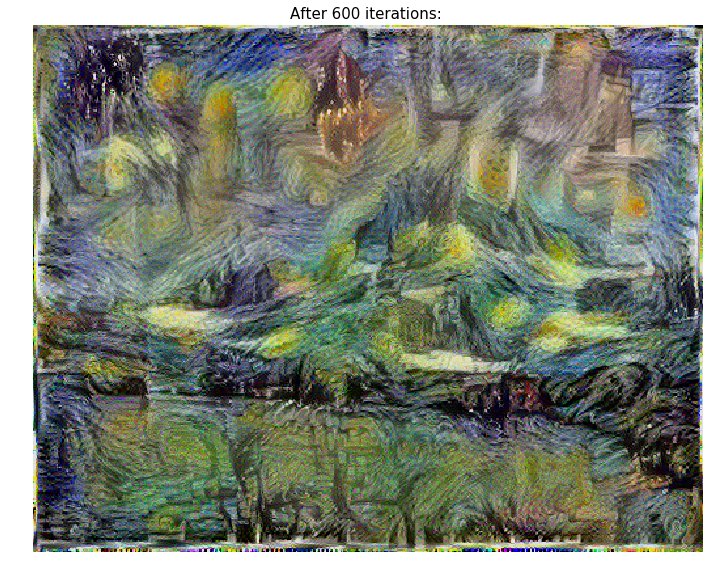

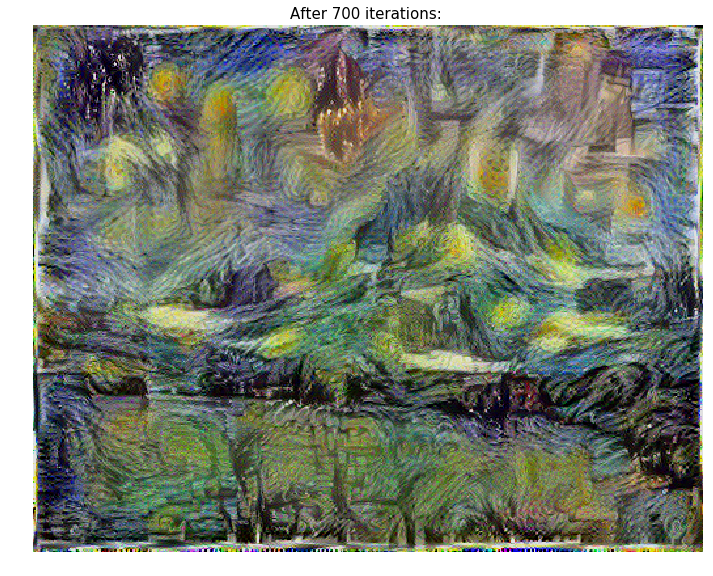

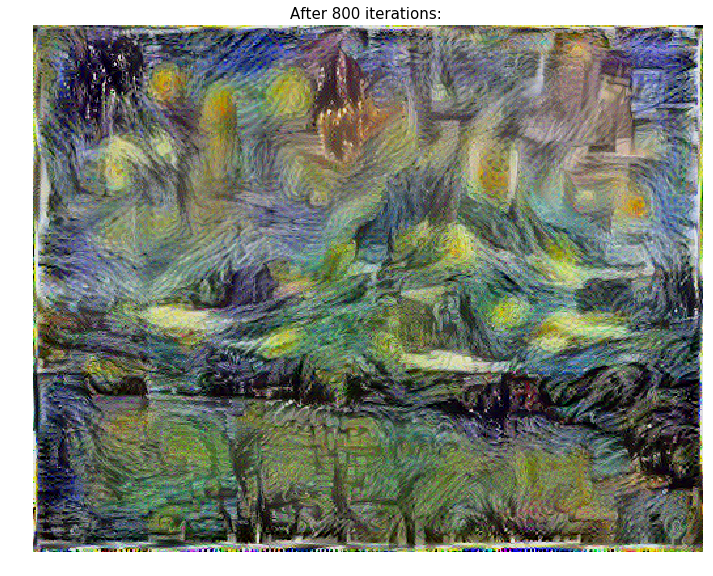

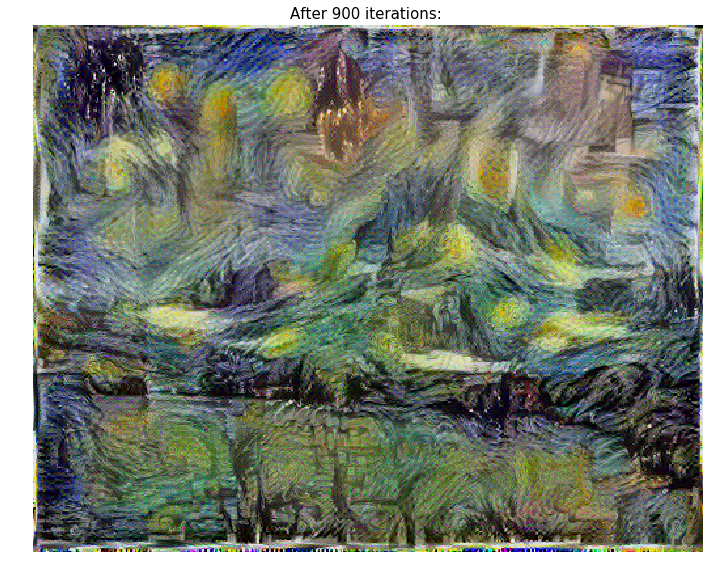

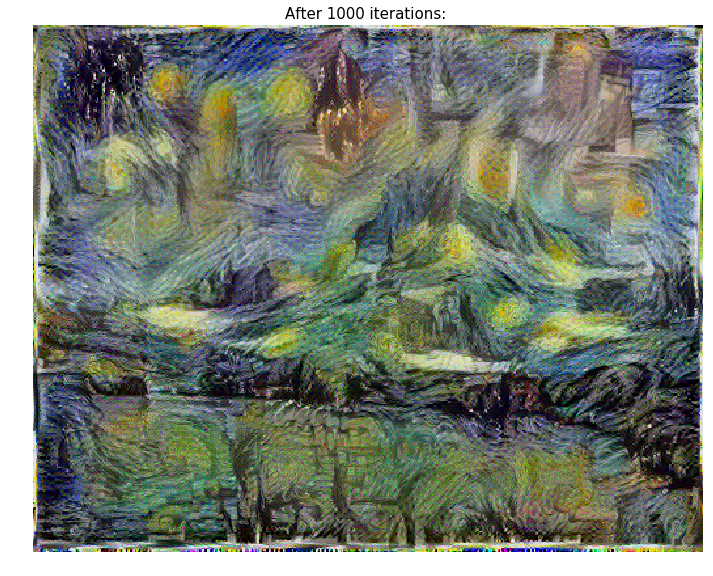

Done


In [498]:
##Run on Starry night


epochs = 6 #10 batches
steps = 100

for i in range(epochs):
    for j in range(steps):
        curr_step += 1
        gradient(image)
        title = "After " + str(curr_step) + " iterations: "
    convert_to_image(image, title)
print("Done")